In [1]:
%pip install numpy
%pip install matplotlib
%pip install sympy
%pip install torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
from sympy import sin
import torch

## [1]. 局所的最適解が存在しない関数

#### [1-1]
$ y = 2x^2 + 3x - 5 $ という関数をプロットする。

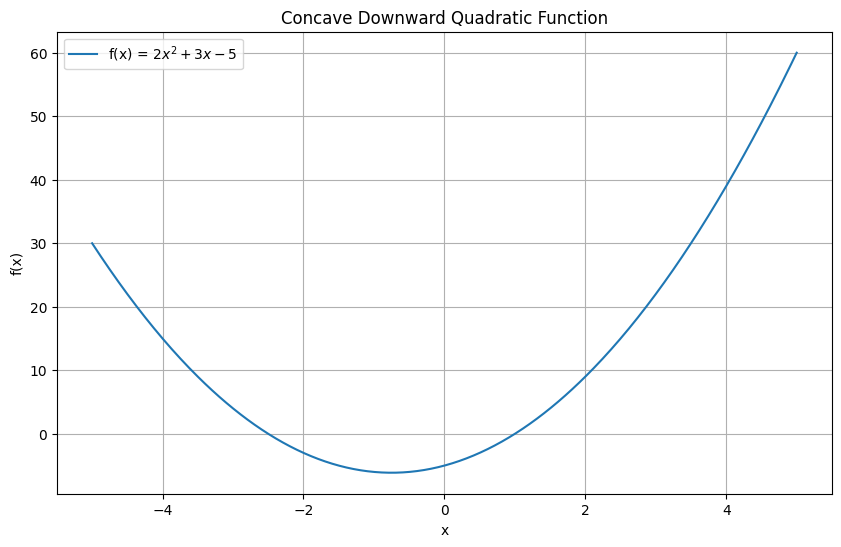

In [2]:
# Define the concave downward quadratic function
def f1(x):
    return 2*x**2 + 3*x - 5

# Generate x values
x1 = np.linspace(-5, 5, 400)
y1 = f1(x1)

# Plotting the function
plt.figure(figsize=(10,6))
plt.plot(x1, y1, label="f(x) = $2x^2 + 3x - 5$")
plt.title("Concave Downward Quadratic Function")
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.grid(True)
plt.show()


#### [1-2]
確率的勾配法(SGD)を用いて最小値を求める過程を図示 \
コード中の下記変数の数字を変えて遊んでみてね
- start_point: 探索の初期位置
- learning_rate: 学習率
- n_iterations: 繰り返し回数

In [9]:
import numpy as np  # <-- Add this line
import torch
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import ArtistAnimation  # <-- Add this line

# Numerical gradient computation
def numerical_gradient(f, x, h=1e-5):
    return (f(x + h) - f(x - h)) / (2 * h)

# ==== ここの数字を色々変更してみてね ====
start_point = 3.0
learning_rate = 0.05
n_iterations = 100
# ==== ここまで =====

fig, ax = plt.subplots(figsize=(10,6))

# Initialize variable
x = torch.tensor([float(start_point)], requires_grad=True)

# Set up the optimizer
optimizer = torch.optim.SGD([x], lr=learning_rate)

# Store history for visualization
history_torch = [x.item()]

# Optimization loop
for _ in range(n_iterations):
    optimizer.zero_grad()
    loss = f1(x)
    loss.backward()
    optimizer.step()
    history_torch.append(x.item())

# Visualization setup
ax.set_xlim(-5, 5)
ax.set_ylim(-10, 30)
ax.plot(x1, y1, label="f(x) = $2x^2 + 3x - 5$")
ax.set_title("Gradient Descent on f(x) = $2x^2 + 3x - 5$")
ax.set_xlabel("x")
ax.set_ylabel("f(x)")
ax.grid(True)

# Create animation frames
frames = []
for x_val in history_torch:  # <-- Use history_torch
    y_val = f1(x_val)
    slope = numerical_gradient(f1, x_val)
    line_x = np.array([x_val - 1, x_val + 1])
    line_y = slope * (line_x - x_val) + y_val
    
    point = ax.scatter(x_val, y_val, color='red', s=100, zorder=5)
    line, = ax.plot(line_x, line_y, color='green', lw=2)
    frames.append([point, line])

# Create animation
ani = ArtistAnimation(fig, frames, interval=200, repeat=True)  # <-- Change this line
html = HTML(ani.to_jshtml())
display(html)
plt.close()

## [2]. 局所的最適解が存在する場合

#### [2-1]
$\frac{1}{6}x^6 - \frac{3}{5}x^5 - x^4 + 4x^3$という関数をプロット

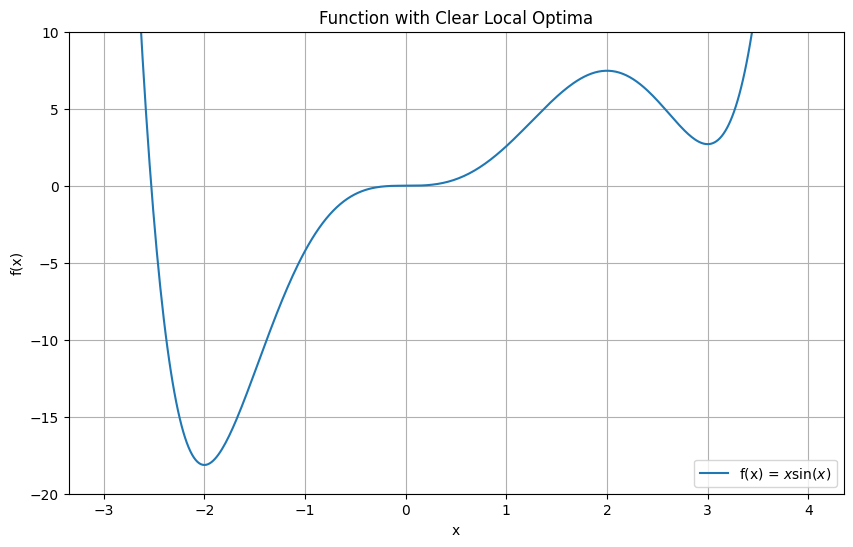

In [10]:
# Define the new function
def f2(x):
    return (1/6)*x**6 - (3/5)*x**5 - x**4 + 4*x**3
# Generate x values
x2 = np.linspace(-3, 4, 400)
# y2 = f2(x2)
y2 = (1/6)*x2**6 - (3/5)*x2**5 - x2**4 + 4*x2**3

# Plotting the function
plt.figure(figsize=(10,6))
plt.plot(x2, y2, label="f(x) = $x \sin(x)$")
plt.title("Function with Clear Local Optima")
plt.ylim(-20, 10)
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.grid(True)
plt.show()


#### [2-2]
確率的勾配法(SGD)を用いて最小値を求める過程を図示(モメンタム無し) \
コード中の下記変数の数字を変えて遊んでみてね
- start_point: 探索の初期位置
- learning_rate: 学習率
- n_iterations: 繰り返し回数

In [5]:
import torch
from IPython.display import HTML, display

# Numerical gradient computation
def numerical_gradient(f, x, h=1e-5):
    return (f(x + h) - f(x - h)) / (2 * h)

# ==== ここを変えてね ====
start_point = 1.5 # 初期位置
learning_rate = 0.02 # 学習率
n_iterations = 100 # 繰り返し回数
# ==== ここまで ====

# Initialize variable
x = torch.tensor([float(start_point)], requires_grad=True)  # Starting from 0

# モメンタム無しver
optimizer = torch.optim.SGD([x], lr=learning_rate)

# Store history for visualization
history_torch = [x.item()]

# Optimization loop
for _ in range(n_iterations):
    optimizer.zero_grad()  # Reset gradients
    loss = f2(x)
    loss.backward()  # Compute gradients
    optimizer.step()  # Update parameter
    history_torch.append(x.item())

# Visualization setup
fig, ax = plt.subplots(figsize=(10,6))
ax.plot(x2, y2, label="f(x) = $(1/6)*x**6 - (3/5)*x**5 - x**4 + 4*x**3$")
ax.set_xlim(-3, 4)
ax.set_ylim(-20, 10)
ax.grid(True)

frames_torch = []
for x_val in history_torch:
    # print(x_val)
    y_val = f2(x_val)
    slope = numerical_gradient(f2, x_val)
    line_x = np.array([x_val - 1, x_val + 1])
    line_y = slope * (line_x - x_val) + y_val
    
    point = ax.scatter(x_val, y_val, color='red', s=100, zorder=5)
    line, = ax.plot(line_x, line_y, color='green', lw=2)
    frames_torch.append([point, line])

# Create the animation using torch SGD
ani_torch = animation.ArtistAnimation(fig, frames_torch, interval=200, repeat=True)
# html_torch = display.HTML(ani_torch.to_jshtml())
html_torch = HTML(ani_torch.to_jshtml())
# display.display(html_torch)
display(html_torch)
plt.close()

[2-3]. 確率的勾配法(SGD)を用いて最小値を求める過程を図示(モメンタム有り) \
コード中の下記変数の数字を変えて遊んでみてね
- start_point: 探索の初期位置
- learning_rate: 学習率
- n_iterations: 繰り返し回数
- momentum: モメンタム 移動平均を適応する

In [6]:
import torch
from IPython.display import HTML, display

# Numerical gradient computation
def numerical_gradient(f, x, h=1e-5):
    return (f(x + h) - f(x - h)) / (2 * h)

# ==== ここを変えてね ====
start_point = 1.5 # 初期位置
learning_rate = 0.02 # 学習率
n_iterations = 100 # 繰り返し回数
momentum = 0.7 # モメンタム
# ==== ここまで ====

# Initialize variable
x = torch.tensor([float(start_point)], requires_grad=True)  # Starting from 0

# モメンタム有りver
optimizer = torch.optim.SGD([x], lr=learning_rate, momentum=momentum)

# Store history for visualization
history_torch = [x.item()]

# Optimization loop
for _ in range(n_iterations):
    optimizer.zero_grad()  # Reset gradients
    loss = f2(x)
    loss.backward()  # Compute gradients
    optimizer.step()  # Update parameter
    history_torch.append(x.item())

# Visualization setup
fig, ax = plt.subplots(figsize=(10,6))
ax.plot(x2, y2, label="f(x) = $(1/6)*x**6 - (3/5)*x**5 - x**4 + 4*x**3$")
ax.set_xlim(-3, 4)
ax.set_ylim(-20, 10)
ax.grid(True)

frames_torch = []
for x_val in history_torch:
    # print(x_val)
    y_val = f2(x_val)
    slope = numerical_gradient(f2, x_val)
    line_x = np.array([x_val - 1, x_val + 1])
    line_y = slope * (line_x - x_val) + y_val
    
    point = ax.scatter(x_val, y_val, color='red', s=100, zorder=5)
    line, = ax.plot(line_x, line_y, color='green', lw=2)
    frames_torch.append([point, line])

# Create the animation using torch SGD
ani_torch = animation.ArtistAnimation(fig, frames_torch, interval=200, repeat=True)
# html_torch = display.HTML(ani_torch.to_jshtml())
html_torch = HTML(ani_torch.to_jshtml())
# display.display(html_torch)
display(html_torch)
plt.close()